In [7]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict
import thesisv3 as tv3

# Import the classes
from thesisv3.classism import MusicFileManager, MusicSegmentAnalyzer, MusicVisualizer, GraphBuilder, GraphBatcher
from thesisv3.validation.clustering import GraphKMeans
from thesisv3.preprocessing.preprocessing import segments_to_graph, kneighbors_graph

In [8]:
file_manager = MusicFileManager()
file_manager.display_selector()

In [9]:
file_manager.selected_file

'./music_database\\Bach_-_Minuet_in_G_Major_Bach.mxl'

In [10]:
analyzer = MusicSegmentAnalyzer()

In [6]:
analyzer.nmat

,onset_beats,onset_beats_in_measure,duration_beats,midi_pitch,pitch_class,octave,beat_strength,mobility,tessitura


In [5]:
analyzer.run(file_manager.selected_file)

ValueError: Found array with 0 sample(s) (shape=(0, 1)) while a minimum of 1 is required by MinMaxScaler.

In [8]:
builder = GraphBuilder(distance_matrix=analyzer.distance_matrix, segments=analyzer.prepped_segments, k=5)
G = builder.construct_graph()
labels = nx.get_node_attributes(G, 'label')
labels

{0: 0.24,
 1: 0.35,
 2: 0.34,
 3: 0.22,
 4: 0.41,
 5: 0.29,
 6: 0.62,
 7: 0.66,
 8: 0.74,
 9: 0.77}

In [5]:
# class GraphBuilder:
#     def __init__(self, k: int, distance_matrix: np.ndarray, segments: list[pd.DataFrame]):
#         self.k = k
#         self.graph = None
#         self.graphs = None
#         self.distance_matrix = distance_matrix
#         self.segments = segments
#     
#     def construct_graph(self):
#         knn_graph = kneighbors_graph(self.distance_matrix, n_neighbors=self.k, mode='connectivity')
#         G = nx.from_scipy_sparse_array(knn_graph)
#         
#         for i in range(len(self.segments)):
#             G.nodes[i]['label'] = self.segments[i]['expectancy'].mean()
#         
#         if not nx.is_connected(G):
#             print("The KNN graph is disjoint. Ensuring connectivity...")
#             
#             components = list(nx.connected_components(G))
#             
#             for i in range(len(components) - 1):
#                 min_dist = np.inf
#                 closest_pair = None
#                 for node1 in components[i]:
#                     for node2 in components[i + 1]:
#                         dist = self.distance_matrix[node1, node2]
#                         if dist < min_dist:
#                             min_dist = dist
#                             closest_pair = (node1, node2)
#                 G.add_edge(closest_pair[0], closest_pair[1])
#         self.graph = G
#         return G

In [6]:
# class GraphBatcher:
#     def __init__(self, k=5):
#         self.k = k
#         self.graphs = []
#         self.segments = []
#         self.distance_matrices = []
#         self.file_manager = MusicFileManager()
#         self.analyzer = MusicSegmentAnalyzer()
#         
#     def batch(self):
#         for file in self.file_manager.files:
#             print(f"Analyzing {file}")
#             try:
#                 self.analyzer.run(self.file_manager.files[file])
#                 builder = GraphBuilder(self.k,
#                                        self.analyzer.distance_matrix,
#                                        self.analyzer.prepped_segments)
#                 self.graphs.append(builder.construct_graph())
#                 self.segments.append(self.analyzer.prepped_segments)
#                 self.distance_matrices.append(self.analyzer.distance_matrix)
#                 
#                 # builder = GraphBuilder(self.k,
#                 #                        segments,
#                 #                        distance_matrix)
#                 # graph = builder.construct_graph()
#                 # self.segments.append(segments)
#                 # self.distance_matrices.append(distance_matrix)
#                 # self.graphs.append(graph)
#                 
#                 # self.segments.append(self.analyzer.prepped_segments)
#                 # self.distance_matrices.append(self.analyzer.distance_matrix)
#                 # 
#                 # builder = GraphBuilder(self.k,
#                 #                        self.analyzer.distance_matrix,
#                 #                        self.analyzer.prepped_segments)
#                 # self.graphs.append(builder.construct_graph())
#             except Exception as e:
#                 print(f"Error parsing: {file} at {self.file_manager.files[file]}. Skipping file")
#                 print(e)
#                 continue

In [11]:
batcher = GraphBatcher(5)
batcher.batch()

Analyzing Bach_-_Minuet_in_G_Major_Bach.mxl
Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (1, 2)
Calculated Edge Weight (1, 3)
Calculated Edge Weight (1, 4)
Calculated Edge Weight (1, 5)
Calculated Edge Weight (1, 6)
Calculated Edge Weight (1, 7)
Calculated Edge Weight (1, 8)
Calculated Edge Weight (2, 3)
Calculated Edge Weight (2, 4)
Calculated Edge Weight (2, 5)
Calculated Edge Weight (2, 6)
Calculated Edge Weight (2, 7)
Calculated Edge Weight (2, 8)
Calculated Edge Weight (3, 4)
Calculated Edge Weight (3, 5)
Calculated Edge Weight (3, 6)
Calculated Edge Weight (3, 7)
Calculated Edge Weight (3, 8)
Calculated Edge Weight (4, 5)
Calculated Edge Weight (4, 6)
Calculated Edge Weight (4, 7)
Calculated Edge Weight (4, 8)
Calculated Edge Weight (5, 6)
Calculated Edge Weight (5,

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (1, 2)
Calculated Edge Weight (1, 3)
Calculated Edge Weight (1, 4)
Calculated Edge Weight (1, 5)
Calculated Edge Weight (1, 6)
Calculated Edge Weight (1, 7)
Calculated Edge Weight (1, 8)
Calculated Edge Weight (

C:\.School\Thesisv3\.venv\Lib\site-packages\music21\musicxml\xmlToM21.py:2206: MusicXMLWarning: Warning: measure 27 in part Pianois overfull: 721/240 > 3.0,assuming 3.0 is correct.
  warnings.warn(
C:\.School\Thesisv3\.venv\Lib\site-packages\music21\musicxml\xmlToM21.py:2206: MusicXMLWarning: Warning: measure 59 in part Pianois overfull: 721/240 > 3.0,assuming 3.0 is correct.
  warnings.warn(


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (1, 2)
Calculated Edge Weight (1, 3)
Calculated Edge Weight (1, 4)
Calculated Edge Weight (1, 5)
Calculated Edge Weight (1, 6)
Calculated Edge Weight (1, 7)
Calculated Edge Weight (1, 8)
Calculated Edge Weight (1, 9)
Calculated Edge Weight (1, 10)
Calculated Edge Weight (1, 11)
Calculated Edge Weight (1

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (1, 2)
Calculated Edge Weight (1, 3)
Calculated Edge Weight (1, 4)
Calculated Edge Weight (1, 5)
Calculated Edge Weight (1, 6)
Calculated Edge Weight (1, 7)
Calculated Edge Weight (1, 8)
Calculated Edge Weight (1, 9)
Calculated Edge Weight (1, 10)
Calculated Edge Weight (1, 11)
Calculated Edge Weight (1, 12)
Calculated Edge Weight (1, 13)
Calculated Edge Weight (1, 14)
Calculated Edge Weight (2, 3)
Calculated Edge Weight (2, 4)
Calculated Edge Weight (2, 5)
Calculated Edge Weight (2, 6)
Calculated Edge Weight (2, 7)
Calculated Edge Weight (2, 8)


C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (1, 2)
Calculated Edge Weight (1, 3)
Calculated Edge Weight (1, 4)
Calculated Edge Weight (1, 5)
Calculated Edge Weight (1, 6)
Calculated Edge Weight (1, 7)
Calculated Edge Weight (1, 8)
Calculated Edge Weight (1, 9)
Calculated Edge Weight (1, 10)
Calculated Edge Weight (1, 11)
Calculated Edge Weight (1, 12)
Calculated Edge Weight (1, 13)
Calculated Edge Weight (1, 14)
Calculated Edge Weight (1, 15)
Calculated Edge Weight (1, 16)
Calculated Edge Weight (1

C:\.School\Thesisv3\.venv\Lib\site-packages\music21\musicxml\xmlToM21.py:5254: MusicXMLWarning: Could not import wedge: Error in getting DynamicWedges
  warnings.warn(f'Could not import {tag}: {excep}', MusicXMLWarning)


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Error parsing: Solo_Violin_Sonata_in_D_Minor_-_E._Ysae_Op._27_No._3.mxl at ./music_database\Ysaye_Six_Sonatas\Solo_Violin_Sonata_in_D_Minor_-_E._Ysae_Op._27_No._3.mxl. Skipping file
Traceback (most recent call last):
  File "C:\.School\Thesisv3\thesisv3\classism.py", line 268, in batch
    self.analyzer.run(self.file_manager.files[file])
  File "C:\.School\Thesisv3\thesisv3\classism.py", line 165, in run
    self.analyze_segments()
  File "C:\.School\Thesisv3\thesisv3\classism.py", line 129, in analyze_segments
    ir_symbols = assign_ir_symbols(narr)
                 ^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\.School\Thesisv3\thesisv3\preprocessing\preprocessing.py", line 466, in assign_ir_symbols
    evaluate_current_group()
  File "C:\.School\Thesisv3\thesisv3\preprocessing\preprocessing.py", line 383, in evaluate_current_group
    interval2 = group_pitches[2] - group_pitches[1]
                ~~~~~~~~~~~~~^^^
IndexError: list index out of range

Analyzing Solo_Violin_Sonata_in_E_Major_-_E

C:\.School\Thesisv3\.venv\Lib\site-packages\music21\musicxml\xmlToM21.py:5254: MusicXMLWarning: Could not import wedge: Error in getting DynamicWedges
  warnings.warn(f'Could not import {tag}: {excep}', MusicXMLWarning)
C:\.School\Thesisv3\.venv\Lib\site-packages\music21\musicxml\xmlToM21.py:2206: MusicXMLWarning: Warning: measure 141 in part Violinis overfull: 161/160 > 1.0,assuming 1.0 is correct.
  warnings.warn(
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

C:\.School\Thesisv3\.venv\Lib\site-packages\music21\musicxml\xmlToM21.py:4163: MusicXMLWarning: Line <dashes> stop without start
  warnings.warn('Line <' + mxObj.tag + '> stop without start', MusicXMLWarning)
C:\.School\Thesisv3\.venv\Lib\site-packages\music21\musicxml\xmlToM21.py:2206: MusicXMLWarning: Warning: measure 14 in part Violinis overfull: 801/160 > 5.0,assuming 5.0 is correct.
  warnings.warn(


Error parsing: Solo_Violin_Sonata_in_E_Minor_-_E._Ysae_Op._27_No._4.mxl at ./music_database\Ysaye_Six_Sonatas\Solo_Violin_Sonata_in_E_Minor_-_E._Ysae_Op._27_No._4.mxl. Skipping file
Traceback (most recent call last):
  File "C:\.School\Thesisv3\thesisv3\classism.py", line 268, in batch
    self.analyzer.run(self.file_manager.files[file])
  File "C:\.School\Thesisv3\thesisv3\classism.py", line 165, in run
    self.analyze_segments()
  File "C:\.School\Thesisv3\thesisv3\classism.py", line 129, in analyze_segments
    ir_symbols = assign_ir_symbols(narr)
                 ^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\.School\Thesisv3\thesisv3\preprocessing\preprocessing.py", line 466, in assign_ir_symbols
    evaluate_current_group()
  File "C:\.School\Thesisv3\thesisv3\preprocessing\preprocessing.py", line 382, in evaluate_current_group
    interval1 = group_pitches[1] - group_pitches[0]
                ~~~~~~~~~~~~~^^^
IndexError: list index out of range

Analyzing Solo_Violin_Sonata_in_G_Major_-_E

C:\.School\Thesisv3\.venv\Lib\site-packages\music21\musicxml\xmlToM21.py:5254: MusicXMLWarning: Could not import wedge: Error in getting DynamicWedges
  warnings.warn(f'Could not import {tag}: {excep}', MusicXMLWarning)
C:\.School\Thesisv3\.venv\Lib\site-packages\music21\musicxml\xmlToM21.py:2206: MusicXMLWarning: Warning: measure 41 in part Violinis overfull: 361/120 > 3.0,assuming 3.0 is correct.
  warnings.warn(
C:\.School\Thesisv3\.venv\Lib\site-packages\music21\musicxml\xmlToM21.py:2206: MusicXMLWarning: Warning: measure 42 in part Violinis overfull: 361/120 > 3.0,assuming 3.0 is correct.
  warnings.warn(
C:\.School\Thesisv3\.venv\Lib\site-packages\music21\musicxml\xmlToM21.py:2206: MusicXMLWarning: Warning: measure 43 in part Violinis overfull: 361/120 > 3.0,assuming 3.0 is correct.
  warnings.warn(
C:\.School\Thesisv3\.venv\Lib\site-packages\music21\musicxml\xmlToM21.py:2206: MusicXMLWarning: Warning: measure 44 in part Violinis overfull: 361/120 > 3.0,assuming 3.0 is correct.
 

Error parsing: Solo_Violin_Sonata_in_G_Major_-_E._Ysae_Op._27_No._5.mxl at ./music_database\Ysaye_Six_Sonatas\Solo_Violin_Sonata_in_G_Major_-_E._Ysae_Op._27_No._5.mxl. Skipping file
Traceback (most recent call last):
  File "C:\.School\Thesisv3\thesisv3\classism.py", line 268, in batch
    self.analyzer.run(self.file_manager.files[file])
  File "C:\.School\Thesisv3\thesisv3\classism.py", line 165, in run
    self.analyze_segments()
  File "C:\.School\Thesisv3\thesisv3\classism.py", line 129, in analyze_segments
    ir_symbols = assign_ir_symbols(narr)
                 ^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\.School\Thesisv3\thesisv3\preprocessing\preprocessing.py", line 466, in assign_ir_symbols
    evaluate_current_group()
  File "C:\.School\Thesisv3\thesisv3\preprocessing\preprocessing.py", line 383, in evaluate_current_group
    interval2 = group_pitches[2] - group_pitches[1]
                ~~~~~~~~~~~~~^^^
IndexError: list index out of range

Analyzing Solo_Violin_Sonata_in_G_Minor_-_E

C:\.School\Thesisv3\.venv\Lib\site-packages\music21\musicxml\xmlToM21.py:4163: MusicXMLWarning: Line <dashes> stop without start
  warnings.warn('Line <' + mxObj.tag + '> stop without start', MusicXMLWarning)


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

In [22]:
from thesisv3.utils.helpers import save_to_pickle

In [27]:
save_to_pickle(batcher.distance_matrices, "distance_matrices")

Data saved to distance_matrices


In [12]:
g_kmeans = GraphKMeans(batcher.processed_files, batcher.graphs, k=4)
clustered, labels = g_kmeans.get_labels()
clustered

,file,label
0,Bach_-_Minuet_in_G_Major_Bach.mxl,3
1,Beethoven_-_Piano_Sonata_No._20_in_G_Major_Op....,3
2,Chopin_-_Ballade_No.1_in_G_minor_Op._23_violin...,2
3,Chopin_-_Etude_Op.10_No.1_Waterfall_Chopin_in_...,1
4,Chopin_-_Etude_Op.25_No.11_in_A_minor_Winter_W...,1
5,Chopin_-_Nocturne_Op_9_No_2_E_Flat_Major.mxl,0
6,Chopin_-_Waltz_Opus_64_No._1_in_D_Major_Minute...,3
7,Chopin_-_Waltz_Opus_64_No._2_in_C_Minor.mxl,2
8,Chopin_-_Waltz_Opus_69_No._1_in_A_Major.mxl,2
9,Mozart_-_Menuett_in_G_Major.mxl,0


In [13]:
labels = nx.get_node_attributes(g_kmeans.graphs[3], 'label')
labels

{0: 0.46,
 1: 0.47,
 2: 0.64,
 3: 0.66,
 4: 0.66,
 5: 0.72,
 6: 0.5,
 7: 0.61,
 8: 0.69,
 9: 0.65,
 10: 0.82,
 11: 0.66,
 12: 0.53,
 13: 0.64,
 14: 0.82,
 15: 0.81,
 16: 0.59,
 17: 0.81,
 18: 0.6,
 19: 0.55,
 20: 0.66,
 21: 0.71,
 22: 0.69,
 23: 0.69,
 24: 0.69,
 25: 0.63,
 26: 0.71,
 27: 0.68,
 28: 0.7,
 29: 0.69,
 30: 0.69,
 31: 0.75,
 32: 0.7,
 33: 0.73,
 34: 0.76,
 35: 0.76,
 36: 0.61,
 37: 0.62,
 38: 0.72,
 39: 0.77,
 40: 0.76,
 41: 0.6,
 42: 0.64,
 43: 0.71,
 44: 0.77,
 45: 0.76,
 46: 0.6,
 47: 0.7,
 48: 0.82,
 49: 0.63,
 50: 0.77,
 51: 0.39,
 52: 0.61,
 53: 0.68,
 54: 0.72,
 55: 0.76,
 56: 0.82,
 57: 0.71,
 58: 0.6,
 59: 0.64,
 60: 0.82,
 61: 0.82,
 62: 0.68,
 63: 0.57,
 64: 0.67,
 65: 0.75,
 66: 0.56,
 67: 0.6,
 68: 0.81,
 69: 0.81,
 70: 0.6,
 71: 0.81,
 72: 0.62,
 73: 0.57,
 74: 0.59,
 75: 0.69,
 76: 0.68,
 77: 0.57,
 78: 0.8,
 79: 0.8,
 80: 0.61,
 81: 0.79,
 82: 0.56,
 83: 0.57,
 84: 0.53,
 85: 0.79,
 86: 0.8,
 87: 0.61,
 88: 0.79,
 89: 0.53,
 90: 0.55,
 91: 0.49,
 92: 0.79,


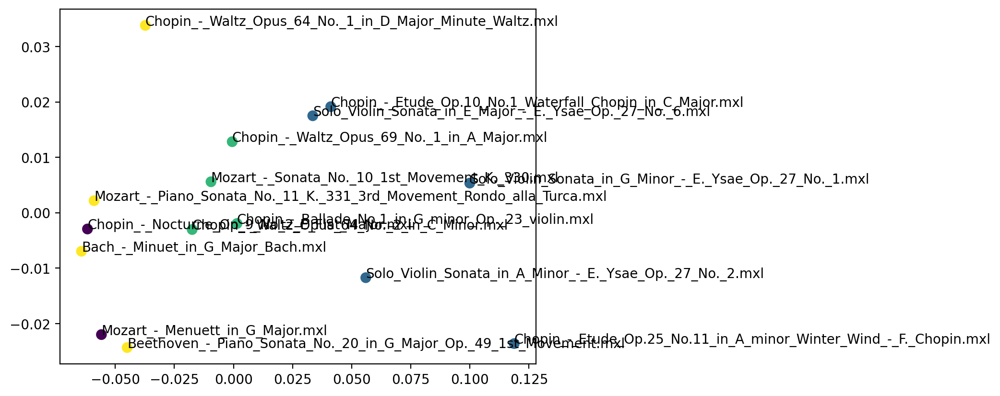

In [14]:
g_kmeans.visualize(display_file_name=True)

In [15]:
batcher.graphs

In [16]:
# def prep_for_wl_kernel(graphs: list[nx.Graph]):
#     all_labels = np.concatenate([list(nx.get_node_attributes(G, 'label').values()) for G in graphs])
#     num_bins = int(np.ceil(1 + np.log2(len(all_labels))))
#     global_bins = np.linspace(all_labels.min(), all_labels.max(), num_bins + 1)
#     processed_graphs = []
#     for G in graphs:
#         labels = np.array(list(nx.get_node_attributes(G, 'label').values()))
#         binned_labels = np.digitize(labels, bins=global_bins)  # Bin the labels
#         label_dict = {node: str(binned_labels[i]) for i, node in enumerate(G.nodes)}  # Convert to string
# 
#         # Assign the new labels to the graph
#         nx.set_node_attributes(G, label_dict, 'label')
#         processed_graphs.append(G)
# 
#     return processed_graphs

In [17]:
labels = nx.get_node_attributes(batcher.graphs[0], 'label')
labels

{0: 0.23,
 1: 0.37,
 2: 0.26,
 3: 0.42,
 4: 0.34,
 5: 0.55,
 6: 0.65,
 7: 0.74,
 8: 0.79}

In [18]:
import grakel as gk

In [19]:
we = gk.WeisfeilerLehman(normalize=True)
type(we)

grakel.kernels.weisfeiler_lehman.WeisfeilerLehman

In [20]:
from thesisv3.validation.tuners import KNNGraphTuner
import grakel as gk

In [21]:
tuner = KNNGraphTuner(graph_kernel=gk.WeisfeilerLehman(normalize=True))
tuner.calculate_and_graph()

Analyzing Bach_-_Minuet_in_G_Major_Bach.mxl
Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (1, 2)
Calculated Edge Weight (1, 3)
Calculated Edge Weight (1, 4)
Calculated Edge Weight (1, 5)
Calculated Edge Weight (1, 6)
Calculated Edge Weight (1, 7)
Calculated Edge Weight (1, 8)
Calculated Edge Weight (2, 3)
Calculated Edge Weight (2, 4)
Calculated Edge Weight (2, 5)
Calculated Edge Weight (2, 6)
Calculated Edge Weight (2, 7)
Calculated Edge Weight (2, 8)
Calculated Edge Weight (3, 4)
Calculated Edge Weight (3, 5)
Calculated Edge Weight (3, 6)
Calculated Edge Weight (3, 7)
Calculated Edge Weight (3, 8)
Calculated Edge Weight (4, 5)
Calculated Edge Weight (4, 6)
Calculated Edge Weight (4, 7)
Calculated Edge Weight (4, 8)
Calculated Edge Weight (5, 6)
Calculated Edge Weight (5,

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (1, 2)
Calculated Edge Weight (1, 3)
Calculated Edge Weight (1, 4)
Calculated Edge Weight (1, 5)
Calculated Edge Weight (1, 6)
Calculated Edge Weight (1, 7)
Calculated Edge Weight (1, 8)
Calculated Edge Weight (

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (1, 2)
Calculated Edge Weight (1, 3)
Calculated Edge Weight (1, 4)
Calculated Edge Weight (1, 5)
Calculated Edge Weight (1, 6)
Calculated Edge Weight (1, 7)
Calculated Edge Weight (1, 8)
Calculated Edge Weight (1, 9)
Calculated Edge Weight (1, 10)
Calculated Edge Weight (1, 11)
Calculated Edge Weight (1

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (1, 2)
Calculated Edge Weight (1, 3)
Calculated Edge Weight (1, 4)
Calculated Edge Weight (1, 5)
Calculated Edge Weight (1, 6)
Calculated Edge Weight (1, 7)
Calculated Edge Weight (1, 8)
Calculated Edge Weight (1, 9)
Calculated Edge Weight (1, 10)
Calculated Edge Weight (1, 11)
Calculated Edge Weight (1, 12)
Calculated Edge Weight (1, 13)
Calculated Edge Weight (1, 14)
Calculated Edge Weight (2, 3)
Calculated Edge Weight (2, 4)
Calculated Edge Weight (2, 5)
Calculated Edge Weight (2, 6)
Calculated Edge Weight (2, 7)
Calculated Edge Weight (2, 8)


C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (1, 2)
Calculated Edge Weight (1, 3)
Calculated Edge Weight (1, 4)
Calculated Edge Weight (1, 5)
Calculated Edge Weight (1, 6)
Calculated Edge Weight (1, 7)
Calculated Edge Weight (1, 8)
Calculated Edge Weight (1, 9)
Calculated Edge Weight (1, 10)
Calculated Edge Weight (1, 11)
Calculated Edge Weight (1, 12)
Calculated Edge Weight (1, 13)
Calculated Edge Weight (1, 14)
Calculated Edge Weight (1, 15)
Calculated Edge Weight (1, 16)
Calculated Edge Weight (1

C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Error parsing: Solo_Violin_Sonata_in_D_Minor_-_E._Ysae_Op._27_No._3.mxl at ./music_database\Ysaye_Six_Sonatas\Solo_Violin_Sonata_in_D_Minor_-_E._Ysae_Op._27_No._3.mxl. Skipping file
list index out of range
Analyzing Solo_Violin_Sonata_in_E_Major_-_E._Ysae_Op._27_No._6.mxl


C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\.School\Thesisv3\.venv\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Calculated Edge Weight (0, 1)
Calculated Edge Weight (0, 2)
Calculated Edge Weight (0, 3)
Calculated Edge Weight (0, 4)
Calculated Edge Weight (0, 5)
Calculated Edge Weight (0, 6)
Calculated Edge Weight (0, 7)
Calculated Edge Weight (0, 8)
Calculated Edge Weight (0, 9)
Calculated Edge Weight (0, 10)
Calculated Edge Weight (0, 11)
Calculated Edge Weight (0, 12)
Calculated Edge Weight (0, 13)
Calculated Edge Weight (0, 14)
Calculated Edge Weight (0, 15)
Calculated Edge Weight (0, 16)
Calculated Edge Weight (0, 17)
Calculated Edge Weight (0, 18)
Calculated Edge Weight (0, 19)
Calculated Edge Weight (0, 20)
Calculated Edge Weight (0, 21)
Calculated Edge Weight (0, 22)
Calculated Edge Weight (0, 23)
Calculated Edge Weight (0, 24)
Calculated Edge Weight (0, 25)
Calculated Edge Weight (0, 26)
Calculated Edge Weight (0, 27)
Calculated Edge Weight (0, 28)
Calculated Edge Weight (0, 29)
Calculated Edge Weight (0, 30)
Calculated Edge Weight (0, 31)
Calculated Edge Weight (0, 32)
Calculated Edge W

ValueError: Expected n_neighbors < n_samples_fit, but n_neighbors = 9, n_samples_fit = 9, n_samples = 9

In [ ]:
tuner.graph_kernel = gk.PyramidMatch(normalize=True)
tuner.calculate_and_graph()

In [ ]:
tuner.graph_kernel = gk.ShortestPath(normalize=True)
tuner.calculate_and_graph()

In [ ]:
tuner.graph_kernel = gk.GraphletSampling(normalize=True)
tuner.calculate_and_graph()

In [ ]:
tuner.graph_kernel = gk.RandomWalkLabeled()
tuner.calculate_and_graph()

In [ ]:
from karateclub.graph_embedding.graph2vec import Graph2Vec

In [ ]:
class GraphKMeans:
    def __init__(self, files: list[str], graphs: list[nx.Graph], k: int):
        if len(files) != len(graphs):
            raise ValueError("File array and graph array are mismatched. File names and indices must correspond to graphs or results may be incorrect")
        self.kmeans = KMeans(n_clusters=k)
        self.files = files
        self.graphs = graphs
        self.model = Graph2Vec()
        self.embeddings = None
    
    def _get_embeddings(self):
        self.model.fit(self.graphs)
        embeddings = self.model.get_embedding()
        self.embeddings = embeddings
        return embeddings
    
    def get_labels(self):
        embeddings = self._get_embeddings()
        labels = self.kmeans.fit_predict(embeddings)
        clustered_graphs = pd.DataFrame(data={"file": self.files,
                                              "label": labels})
        return clustered_graphs, labels
    
    def visualize(self, display_file_name=False):
        clustered_graphs, labels = self.get_labels()
        pca_embed = PCA(n_components=2).fit_transform(self.embeddings)
        
        fig, ax = plt.subplots()
        ax.scatter(pca_embed[:,0], pca_embed[:,1], c=labels, cmap='viridis', s=50)
        if display_file_name:
            for i, txt in enumerate(self.files):
                ax.annotate(txt, (pca_embed[i,0], pca_embed[i,1]))
        plt.show()

In [ ]:
g_kmeans = GraphKMeans(batcher.processed_files, batcher.graphs, k=4)
clustered, labels = g_kmeans.get_labels()
clustered

In [ ]:
g_kmeans.visualize(display_file_name=True)

In [ ]:
for file, graph in zip(batcher.processed_files, batcher.graphs):
    print(f"{file}: {graph}")

In [ ]:
model = Graph2Vec()
model.fit(graphs=batcher.graphs)
embeddings = model.get_embedding()
embeddings

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4)
labels = kmeans.fit_predict(embeddings)
labels

In [ ]:
for file, label in zip(batcher.processed_files, labels):
    print(f"{file}: {label}")

In [ ]:
from sklearn.decomposition import PCA
pca_embed = PCA(n_components=2).fit_transform(embeddings)
pca_embed

In [ ]:
# from sklearn.cluster import KMeans
# kmeans = KMeans(n_clusters=4)
# labels = kmeans.fit_predict(pca_embed)
# labels

In [ ]:
for song, label in zip(batcher.processed_files, labels):
    print(f"{song}: {label}")

In [ ]:
fig, ax = plt.subplots()
ax.scatter(pca_embed[:, 0], pca_embed[:, 1], c=labels, cmap='viridis', s=50)
for i, txt in enumerate(batcher.processed_files):
    ax.annotate((labels[i],txt), (pca_embed[i,0], pca_embed[i,1]))

In [ ]:
def mobility(nmat: pd.DataFrame):
    """
    Melodic motion as a mobility (Hippel, 2000).
    Based on mobility function from MidiToolKit (Toiviainen. 2016)
    """
    if len(nmat) == 0:
        return np.array([])
    
    pitches = nmat['midi_pitch'].to_numpy()
    n = len(nmat.index)
    
    if n < 2:
        return np.zeros(n)
    
    mob = np.zeros(n)
    y = np.zeros(n)
    
    for i in range(1, n):
        mean_pitch = np.mean(pitches[:i])
        
        p = pitches[:i] - mean_pitch
        p2 = pitches[1:i+1] - mean_pitch
        
        if len(p) > 1:
            correlation_matrix = np.corrcoef(p, p2)
            mob[i] = correlation_matrix[0, 1] if not np.isnan(correlation_matrix[0, 1]) else 0
            
        y[i-1] = mob[i-1] * (pitches[i] - mean_pitch) 
        
    y[-1] = 0
    
    return np.abs(y)

In [ ]:
mobility(analyzer.nmat)

In [ ]:
analyzer.nmat['mobility'] = mobility(analyzer.nmat)
analyzer.nmat

In [ ]:
def tessitura(nmat:pd.DataFrame):
    """
    Melodic tessitura based on deviation from median pitch height (Hippel, 2000)
    Based on tessitura function from MidiToolKit (Toiviainen. 2016)
    """
    n = len(nmat.index)
    if n < 2:
        return np.zeros(n)
    pitches = nmat['midi_pitch'].to_numpy()
    deviation = np.zeros(n)
    y = np.zeros(n)
    for i in range(1, n):
        median_pitch = np.median(pitches[:i])
        deviation[i-1] = np.std(pitches[:i])
        y[i-1] = (pitches[i] - median_pitch) / deviation[i-1]
        y[0] = 0
    return np.abs(y)

In [ ]:
tessitura(analyzer.nmat)

In [9]:
from thesisv3.utils.helpers import nx_to_grakel
import networkx as nx
from grakel import Graph

In [46]:
labels = nx.get_node_attributes(G, 'label')
labels

{0: 0.5066099043582991,
 1: 0.5608161407295784,
 2: 0.5414856248890305,
 3: 0.49303341936932304,
 4: 0.5711644721156067,
 5: 0.5082863487252414,
 6: 0.5329543595741193,
 7: 0.5837986481036845,
 8: 0.5590003806181906,
 9: 0.5737305726952793}

In [10]:
# edges = list(G.edges())

In [11]:
# grakel_g = Graph(edges, node_labels=labels)

In [12]:
# print(grakel_g)

In [8]:
visualizer = MusicVisualizer(analyzer)

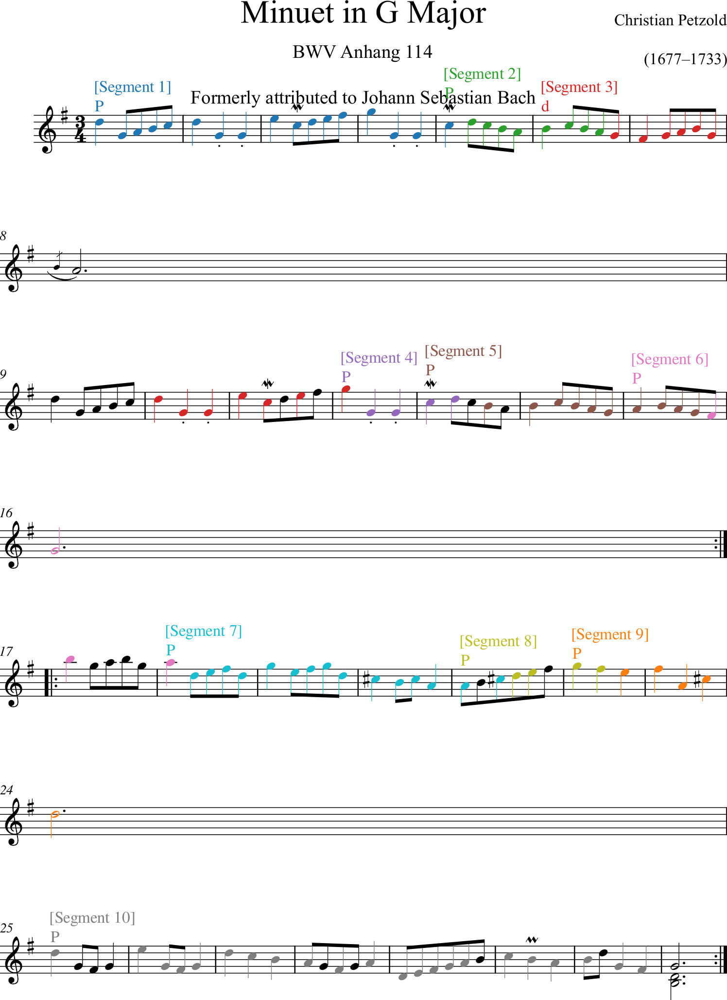

In [9]:
visualizer.visualize_colored_segments()

In [10]:
visualizer.visualize_multiple_segments(5)

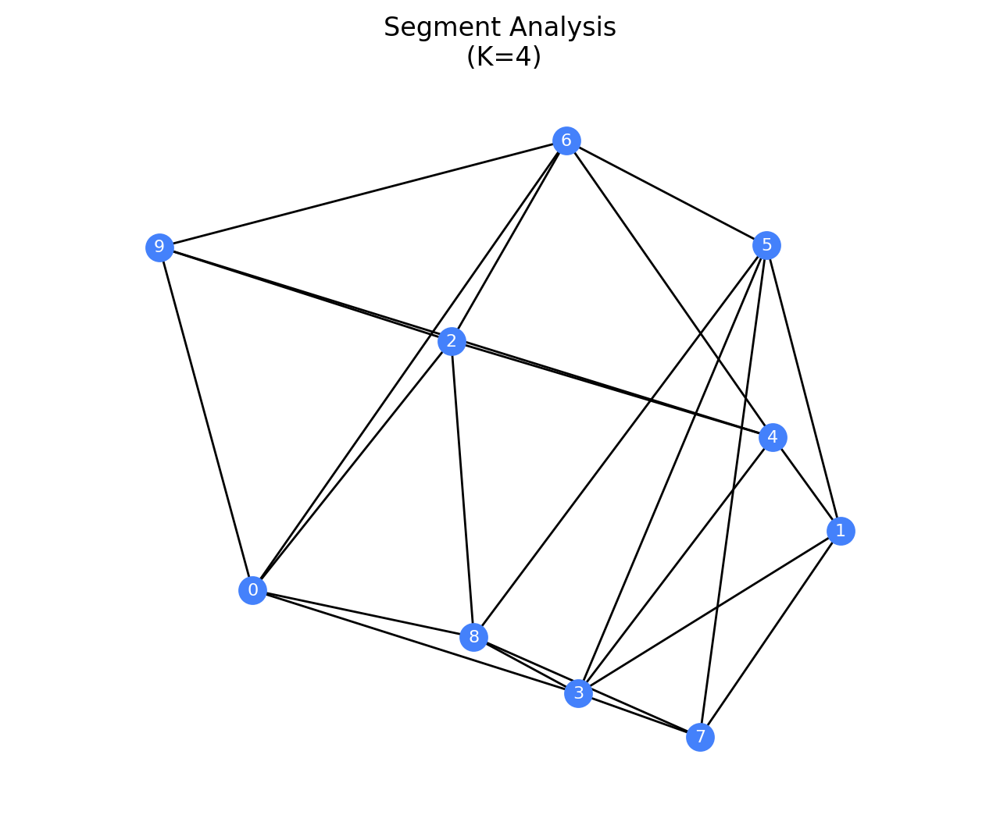

In [11]:
visualizer.visualize_knn_graph(k=4, title="Segment Analysis")